/usr/local/lib/python3.10/dist-packages/scipy/cluster/hierarchy.py:833: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='ward', metric='euclidean')


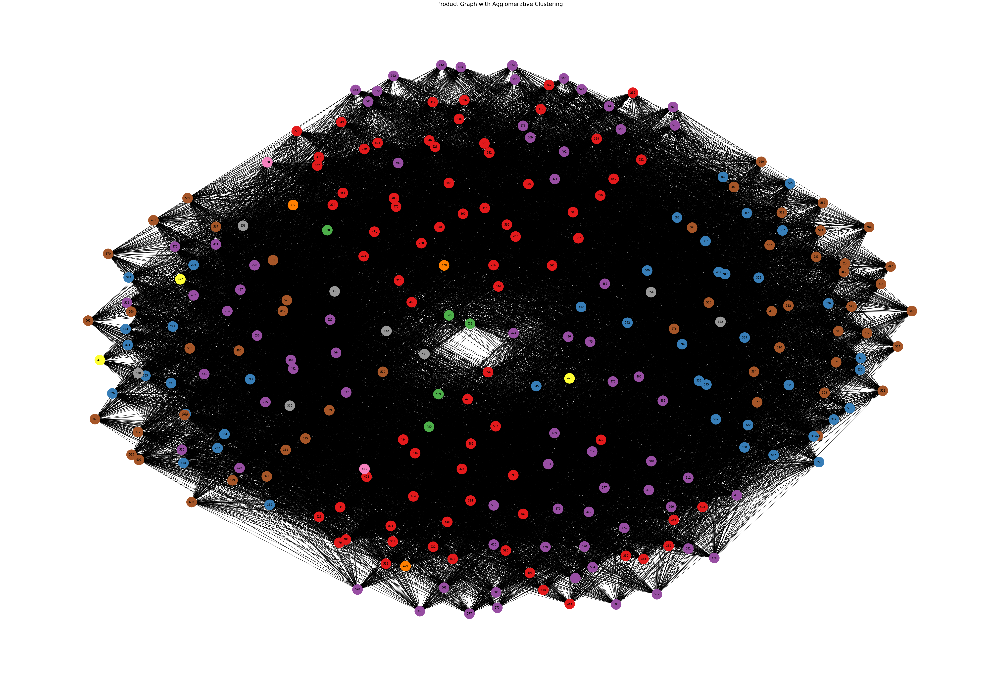

Cluster 1:
Int64Index([214], dtype='int64')


Cluster 2:
Int64Index([229, 232, 235, 310, 322, 324, 326, 328, 330, 332, 334, 336, 338,
            340, 342, 344, 345, 346, 347, 348, 349, 350, 351, 352, 383, 385,
            387, 389, 462, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597,
            598, 599, 600, 604],
           dtype='int64')


Cluster 4:
Int64Index([215, 220, 223, 226, 464, 466, 471, 472, 473, 474, 475, 476, 477,
            482, 483, 484, 485, 486, 487, 488, 529, 536, 537, 538],
           dtype='int64')


Cluster 7:
Int64Index([478, 479, 480], dtype='int64')


Cluster 8:
Int64Index([481, 530, 539, 540, 541], dtype='int64')


Cluster 9:
Int64Index([311, 312, 313, 314, 320, 369, 370, 371, 373, 375, 377, 379, 381,
            489, 490, 491, 528, 561, 562, 563, 564, 565, 566, 567, 568, 569,
            570, 571, 572, 573, 574, 575, 576, 577, 578, 579, 580, 581, 582,
            583, 584, 585, 586, 587, 605, 606],
           dtype='int64')


Cluster 11:
Int64Index([535

In [ ]:
import pandas as pd
import networkx as nx
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt

# Load the cross-sold score matrix from CSV
cross_sold_scores_df = pd.read_csv('/content/drive/MyDrive/CSS_matrix 100.csv', index_col=0)

# Create a graph from cross-sold score data
G = nx.Graph()

# Add nodes and edges to the graph based on cross-sold scores
for product1 in cross_sold_scores_df.index:
    for product2 in cross_sold_scores_df.columns:
        score = cross_sold_scores_df.loc[product1, product2]
        if product1 != product2 and score > 0:  # Avoid self-loops and consider non-zero scores
            G.add_edge(product1, product2, weight=score)

# Check for self-loops in the graph
self_loops = list(nx.nodes_with_selfloops(G))
if self_loops:
    print("Self-loops detected in the graph. Removing self-loops.")
    G.remove_edges_from(nx.selfloop_edges(G))

# Perform hierarchical agglomerative clustering
num_clusters = 13  # You can adjust the number of clusters
agglomerative = AgglomerativeClustering(n_clusters=num_clusters)
cluster_labels = agglomerative.fit_predict(nx.to_numpy_array(G))

# Create a mapping dictionary to align cluster labels with product indices
product_keys = cross_sold_scores_df.index.unique()
cluster_mapping = dict(zip(product_keys, cluster_labels))

# Create a new DataFrame with unique indices for products
unique_products_df = pd.DataFrame(index=product_keys)

# Assign cluster labels to the new DataFrame using the mapping dictionary
unique_products_df['Cluster_Labels'] = unique_products_df.index.map(cluster_mapping)

# Visualize the product graph with cluster colors
pos = nx.spring_layout(G)  # You can use different layout algorithms based on your preference
plt.figure(figsize=(60, 40))
node_labels = {node: str(node) for node in G.nodes()}
nx.draw(G, pos, node_color=cluster_labels, labels=node_labels, with_labels=True, node_size=2000, cmap=plt.cm.Set1)
plt.title('Product Graph with Agglomerative Clustering', fontsize=24)
plt.savefig('product_graph.png')
plt.show()

# Save cluster labels to the original cross-sold score DataFrame
cross_sold_scores_df['Cluster_Labels'] = unique_products_df['Cluster_Labels']

# Save the updated DataFrame with cluster labels
cross_sold_scores_df.to_csv('/content/drive/MyDrive/cross_sold_scores_with_clusters.csv')

# Group the DataFrame by cluster labels and print products in each cluster
cluster_groups = cross_sold_scores_df.groupby('Cluster_Labels')

for cluster_label, cluster_df in cluster_groups:
    print(f'Cluster {cluster_label}:')
    print(cluster_df.index)
    print('\n')

# Save the updated DataFrame with cluster labels
cross_sold_scores_df.to_csv('/content/drive/MyDrive/cross_sold_scores_with_clusters.csv')



In [ ]:
# Get the product in the user's basket (replace 'user_product_key' with the actual product key in the user's basket)
user_product_key = int(input("Enter the product in the basket: ")) # Example product key in the user's basket
num_recommendations = int(input("Enter the number of recommendations required: "))  # Number of recommendations to make

# Find the cluster label of the user's product
user_product_cluster_label = cluster_mapping.get(user_product_key, None)

if user_product_cluster_label is not None:
    # Find products in the same cluster as the user's product
    products_in_cluster = unique_products_df[unique_products_df['Cluster_Labels'] == user_product_cluster_label].index.tolist()

    # Exclude the user's product from the recommendation list if it's in the same cluster
    products_to_recommend = [product for product in products_in_cluster if product != user_product_key]

    if products_to_recommend:
        # Recommend the specified number of products (or less if there are fewer products available)
        recommended_products = products_to_recommend[:num_recommendations]
        print(f"Recommended products for cross-selling: {recommended_products}")
    else:
        print("No products available for cross-selling in the same cluster.")
else:
    print("User's product not found in the clustered graph.")


Enter the product in the basket: 226
Enter the number of recommendations required: 2
Recommended products for cross-selling: [215, 220]


In [ ]:
def calculate_precision_at_k(actual_products, recommended_products, k):
    # Take only the top k recommended products
    recommended_at_k = set(recommended_products[:k])

    # Calculate the intersection of recommended products and actual products
    intersection = set(actual_products) & recommended_at_k

    # Calculate precision at k
    precision_at_k = len(intersection) / k

    return precision_at_k

actual_products = [332, 232, 235, 315]  # Replace these product keys with the actual products in the user's basket
user_product_key = int(input("Enter the product in the basket: "))  # Example user's product key
num_recommendations = int(input("Enter the number of recommendations required: "))  # Number of recommendations to make

k = num_recommendations

# Assuming you have the clustered products and their corresponding cluster labels
clustered_products = unique_products_df.index.tolist()
cluster_labels = unique_products_df['Cluster_Labels'].tolist()

# Create a dictionary to map product keys to cluster labels
cluster_mapping = dict(zip(clustered_products, cluster_labels))

# Find the cluster label of the user's product
user_product_cluster_label = cluster_mapping.get(user_product_key, None)

if user_product_cluster_label is not None:
    # Find products in the same cluster as the user's product
    products_in_cluster = unique_products_df[unique_products_df['Cluster_Labels'] == user_product_cluster_label].index.tolist()

    # Exclude the user's product from the recommendation list if it's in the same cluster
    products_to_recommend = [product for product in products_in_cluster if product != user_product_key]

    if products_to_recommend:
        # Recommend the specified number of products (or less if there are fewer products available)
        recommended_products = products_to_recommend[:num_recommendations]
        print(f"Recommended products for cross-selling: {recommended_products}")
    else:
        print("No products available for cross-selling in the same cluster.")
else:
    print("User's product not found in the clustered graph.")


# Calculate precision at k
precision_at_k = calculate_precision_at_k(actual_products, recommended_products, k)

print(f'Precision at {k}: {precision_at_k:.2f}')


Enter the product in the basket: 332
Enter the number of recommendations required: 3
Recommended products for cross-selling: [229, 232, 235]
Precision at 3: 0.67


In [ ]:
def calculate_precision(actual_products, recommended_products):
    # Calculate precision: Intersection of actual and recommended products divided by the number of recommended products
    intersection = set(actual_products) & set(recommended_products)
    precision_value = len(intersection) / len(recommended_products) if len(recommended_products) > 0 else 0
    return precision_value

def calculate_recall(actual_products, recommended_products):
    # Calculate recall: Intersection of actual and recommended products divided by the number of actual products
    intersection = set(actual_products) & set(recommended_products)
    recall_value = len(intersection) / len(actual_products) if len(actual_products) > 0 else 0
    return recall_value


def calculate_f1_score(actual_products, recommended_products):
    # Calculate precision
    precision = calculate_precision(actual_products, recommended_products)

    # Calculate recall
    recall = calculate_recall(actual_products, recommended_products)

    # Calculate F1 score
    if precision + recall == 0:
        f1_score = 0  # Handle the case where both precision and recall are zero
    else:
        f1_score = 2 * (precision * recall) / (precision + recall)

    return f1_score

f1_score = calculate_f1_score(actual_products, recommended_products)
print(f'F1 score: {f1_score:.2f}')
